In [1]:
# --- Standard Library ---
import os
import re
import io
import sys
import time
import json
import math
import html
import random
import pathlib
import zipfile
import urllib.request
import urllib.parse
from collections import Counter, defaultdict

# --- Third-party libraries ---
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import matplotlib.patches as mpatches
import networkx as nx
from bs4 import BeautifulSoup
from wordcloud import WordCloud

# --- NLP / Text ---
import nltk
from nltk import pos_tag, word_tokenize
from nltk.corpus import stopwords, words, wordnet
from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text
from sklearn.metrics.pairwise import cosine_similarity

# --- NLTK Downloads ---
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('words')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!

True

In [56]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text
import nltk
from nltk.corpus import words
nltk.download('words')

# --- constants built once ---
STOPWORDS_ANALYZER = text.ENGLISH_STOP_WORDS.union({
    "ref","refs","reference","references","retrieved","accessed","archive","archived",
    "url","https","http","www","com","org","net","title","web","cite","page","pages",
    "vol","vol.","no","isbn","issn","doi","pdf","category","external","link","links",
    "file","image","amp","nbsp","till","lguitar","color","bgcolor","font","style",
    "align","center","phrase","width","height","border","px","margin","padding","table","div",
    "span","textalign","rowspan","colspan","ruby","cellpadding","cellspacing","valign","class",
    "id","background","em","text","value","size","bar","scope","row","col","alb",
    "start","end","legend","template","infobox","thumb","gallery","metadata","nav",
    "content", "axis",
})
SECTION_CUT_ANALYZER = re.compile(r'(?im)^\s*(references|external\s+links|see\s+also|notes)\s*$')

# precompute once
lemmatizer = WordNetLemmatizer()
english_vocab_analyzer = set(map(str.lower, words.words()))

# avoid repeated soup construction
_soup_parser = BeautifulSoup

# precompile regexes
RE_CLEANERS = [
    re.compile(r"\{\{[^}]+\}\}"), re.compile(r"\[\[[^\]]+\]\]"),
    re.compile(r"http\S+|www\.\S+"), re.compile(r"#[A-Fa-f0-9]{3,6}"),
    re.compile(r"\b[a-z\-]*(color|width|height|font|align|style|margin|padding|px)\b"),
    re.compile(r"[^\x00-\x7F]+"), re.compile(r"\s+"),
    re.compile(r"\b[A-Z][a-z]+\b")
]

def fast_clean_text(raw: str) -> str:
    """Fast wiki/html cleaner."""
    if not raw:
        return ""
    t = html.unescape(raw)
    cut = SECTION_CUT_ANALYZER.search(t)
    if cut:
        t = t[:cut.start()]
    # strip tags quickly
    t = _soup_parser(t, "lxml").get_text(" ")
    for r in RE_CLEANERS:
        t = r.sub(" ", t)
    t = re.sub(r"\b[A-Z]{2,}\b", " ", t)
    t = re.sub(r"\b[A-Z][a-z]{2,}\b", " ", t)
    t = re.sub(r"\s+", " ", t).strip().lower()
    return t


def fast_is_garbage(token: str, all_genres: set) -> bool:
    """Lightweight token filter."""
    L = len(token)
    if token.isupper():
        return True
    if L <= 2 or L > 25:
        return True
    if any(c.isdigit() for c in token):
        return True
    if not re.search(r"[aeiou]", token) and not token.isupper():
        return True
    if re.search(r"(.)\1{2,}", token):
        return True
    if token not in english_vocab_analyzer and token not in all_genres and not token.isupper():
        return True
    return False


def get_wordnet_pos(tag: str):
    if tag[0] == "J": return wordnet.ADJ
    if tag[0] == "V": return wordnet.VERB
    if tag[0] == "R": return wordnet.ADV
    return wordnet.NOUN


def make_analyzer(all_genres: set, stopwords=None):
    """
    Return a closure analyzer that uses fixed stopwords and genre vocabulary.
    Always includes STOPWORDS_ANALYZER, and merges any provided stopwords with it.
    """
    # Ensure STOPWORDS_ANALYZER is always part of the final set
    if stopwords is None:
        stopwords = STOPWORDS_ANALYZER
    else:
        stopwords = STOPWORDS_ANALYZER.union(stopwords)

    def analyzer(doc: str):
        doc = re.sub(r"[^a-z\s]+", " ", fast_clean_text(doc))
        toks = [
            w for w in doc.split()
            if w not in stopwords and not fast_is_garbage(w, all_genres)
        ]
        return [lemmatizer.lemmatize(w) for w in toks]

    return analyzer

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


In [3]:
def extract_clubs(text):
    """
    Extract all manager clubs from the Wikipedia infobox section.
    Matches lines like '| managerclubs1 = [[Chelsea F.C.|Chelsea]] (caretaker)'
    and cleans the results.
    """
    clubs = set()
    
    # Find all lines like '| managerclubsX = ...'
    matches = re.findall(r'\|\s*managerclubs\d+\s*=\s*(.+)', text)

    for m in matches:
        # Extract club names inside [[...]]
        inner_links = re.findall(r'\[\[([^|\]]+)(?:\|([^]]+))?\]\]', m)
        for link in inner_links:
            # prefer the visible name (after |), else use the page name
            club = link[1] if link[1] else link[0]
            # strip 'F.C.' and trailing spaces, parentheses, etc.
            club = re.sub(r'\s*\(.*?\)', '', club)
            club = club.replace('F.C.', '').strip()
            if club:
                clubs.add(club)
        # Also catch plain-text clubs (no [[]] markup)
        plain = re.sub(r'\[\[.*?\]\]', '', m)
        plain = re.sub(r'\s*\(.*?\)', '', plain)
        plain = plain.strip()
        if plain and len(plain.split()) <= 4:
            clubs.add(plain)
    return clubs

def extract_years(text):
    # Matches single years or ranges like "1978" or "1981–1983"
    matches = re.findall(r"(\d{4})(?:[–-](\d{2,4}))?", text)
    years = []
    for start, end in matches:
        start = int(start)
        if end:  # Handle year ranges
            end = int(end) if len(end) == 4 else int(start // 100 * 100 + int(end))
        else:  # Handle single years
            end = start
        if 1900 < start < 2100 and 1900 < end < 2100:
            years.append((start, end))
    return years


In [4]:
def extract_club_year_pairs(text):
    """
    Extract (club, start_year, end_year) tuples aligned by their index (e.g. 1..14)
    """
    club_lines = re.findall(r'\|\s*managerclubs(\d+)\s*=\s*(.+)', text)
    year_lines = re.findall(r'\|\s*manageryears(\d+)\s*=\s*(.+)', text)
    year_dict = {}

    for idx, ytext in year_lines:
        yrs = extract_years(ytext)
        year_dict[int(idx)] = yrs[0] if yrs else (None, None)

    pairs = []
    for idx, ctext in club_lines:
        idx = int(idx)
        clubs = list(extract_clubs(f"| managerclubs{idx} = {ctext}"))
        if clubs:
            start, end = year_dict.get(idx, (None, None))
            for c in clubs:
                pairs.append((c, start, end))
    return pairs


In [39]:
def extract_wikilinks(text):
    """
    Extract all wiki links [[...]] from raw Wikipedia wikitext.
    Returns the visible title (after the |) if present.
    """
    links = []
    matches = re.findall(r"\[\[([^]]+)\]\]", text)
    for m in matches:
        # [[Page|Displayed Name]] → take Displayed Name
        if "|" in m:
            page, display = m.split("|", 1)
            links.append(display.strip())
        else:
            links.append(m.strip())
    return links

def normalize(name):
    return name.lower().replace("_", " ").strip()


In [74]:
save_dir = "managers"

texts = {}
club_years = {}

for fname in os.listdir(save_dir):
    if not fname.endswith(".txt"):
        continue

    manager = fname[:-4].replace("_", " ")
    with open(os.path.join(save_dir, fname), encoding="utf-8") as f:
        raw = f.read()

    texts[manager] = raw.lower()
    club_years[manager] = extract_club_year_pairs(raw)

print(f"Extracted data for {len(texts)} managers.")

all_genres = set()
analyzer = make_analyzer(all_genres)

cleaned_texts = {
    m: " ".join(analyzer(texts[m]))
    for m in texts
}


G = nx.DiGraph()

# Add manager nodes with start_year
for manager, pairs in club_years.items():
    if pairs:
        start_year = min(s for _, s, _ in pairs if s is not None)
    else:
        start_year = None

    G.add_node(manager,
               type="manager",
               text=cleaned_texts[manager],
               start_year=start_year)



# def overlap(p1, p2):
#     s1, e1 = p1
#     s2, e2 = p2
#     return (s1 is not None and s2 is not None and not (e1 < s2 or e2 < s1))

# for m1, pairs1 in club_years.items():
#     for m2, pairs2 in club_years.items():
#         if m1 >= m2:
#             continue
#         for c1, s1, e1 in pairs1:
#             for c2, s2, e2 in pairs2:
#                 if c1 == c2 and overlap((s1, e1), (s2, e2)):
#                     G.add_edge(m1, m2, type="shared_club", club=c1)
#                     break


# Language similarity between managers
# vec = TfidfVectorizer(analyzer=analyzer, min_df=0.01, max_df=0.85)
# X = vec.fit_transform(cleaned_texts.values())
# similarity = cosine_similarity(X)
# managers_list = list(cleaned_texts.keys())

# for i in range(len(managers_list)):
#     for j in range(i + 1, len(managers_list)):
#         sim = similarity[i, j]
#         if sim > 0.3:
#             G.add_edge(managers_list[i], managers_list[j],
#                        type="language", weight=sim)
            
            
manager_names = list(texts.keys())
normalized_manager_names = {normalize(m): m for m in manager_names}

reference_edges = []

for manager, raw in texts.items():
    links = extract_wikilinks(raw)
    for link in links:
        norm = normalize(link)
        if norm in normalized_manager_names:
            mentioned = normalized_manager_names[norm]
            if mentioned != manager:
                reference_edges.append((manager, mentioned))

# Add to graph
for a, b in reference_edges:
    G.add_edge(a, b, type="reference")


print(f"Final network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges.")
print("Edge types:", set(d.get("type") for _, _, d in G.edges(data=True)))

Extracted data for 286 managers.
Final network: 286 nodes, 1913 edges.
Edge types: {'reference'}


In [79]:
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())

# Convert to numpy arrays
in_vals = np.array(list(in_degrees.values()))
out_vals = np.array(list(out_degrees.values()))

print("In-degree:")
print(in_vals[:10])
print("  Mean:       ", in_vals.mean())
print("  Median:     ", np.median(in_vals))
print("  Max:        ", in_vals.max())

print("\nOut-degree:")
print(out_vals[:10])
print("  Mean:       ", out_vals.mean())
print("  Median:     ", np.median(out_vals))
print("  Max:        ", out_vals.max())


In-degree:
[ 0  5  2  3  4  0 14  0  0 18]
  Mean:        6.688811188811189
  Median:      4.0
  Max:         40

Out-degree:
[4 6 5 6 2 7 8 4 2 5]
  Mean:        6.688811188811189
  Median:      6.0
  Max:         30


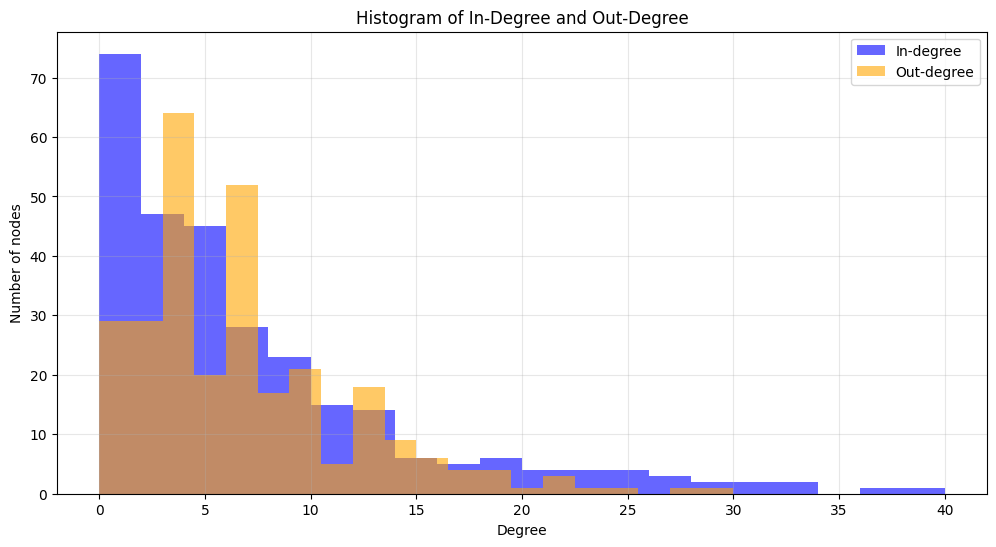

In [ ]:
# Convert to lists
in_vals = list(in_degrees.values())
out_vals = list(out_degrees.values())

plt.figure(figsize=(12, 6))

plt.hist(in_vals, bins=20, alpha=0.6, label="In-degree", color="blue")
plt.hist(out_vals, bins=20, alpha=0.6, label="Out-degree", color="orange")

plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Histogram of In-Degree and Out-Degree")
plt.legend()
plt.grid(alpha=0.3)

plt.savefig("degree_histogram.png")
plt.show()


Reference-only graph: 286 nodes, 1811 edges


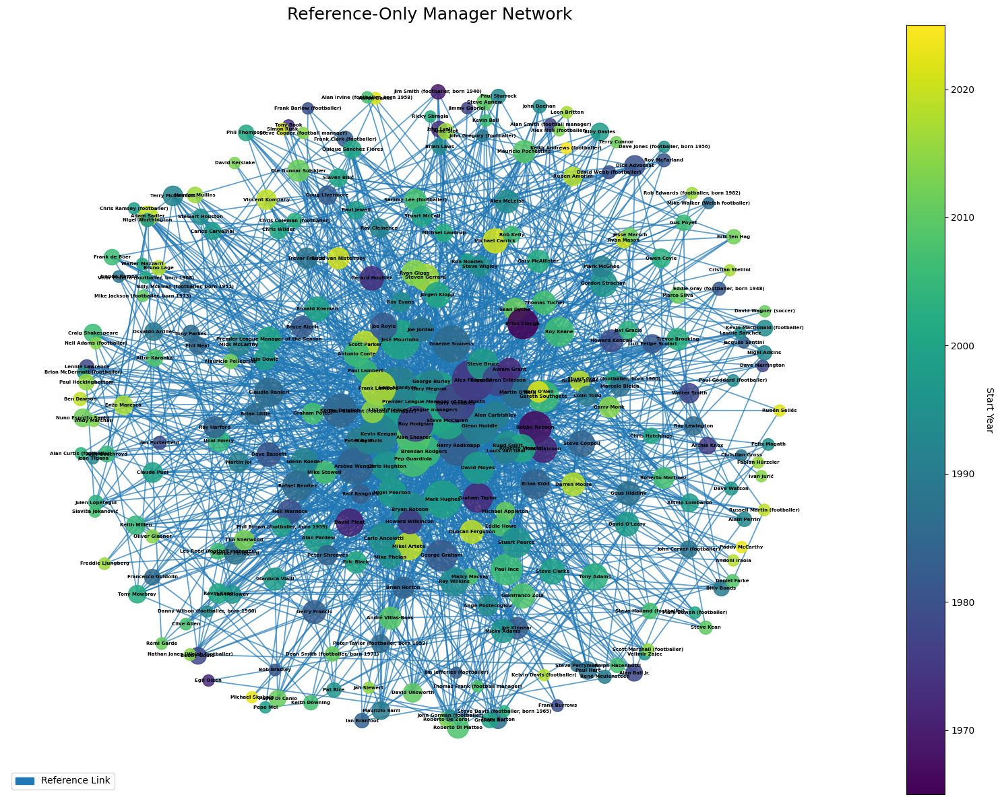

In [46]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import networkx as nx

# -------------------------------------------
# 1. Extract ONLY reference edges into H
# -------------------------------------------
H = nx.Graph([
    (u, v, d) for u, v, d in G.edges(data=True)
    if d.get("type") == "reference"
])

# Copy node attributes from G → H
for n in H.nodes():
    H.nodes[n].update(G.nodes[n])

print(f"Reference-only graph: {H.number_of_nodes()} nodes, {H.number_of_edges()} edges")

# -------------------------------------------
# If no edges, abort early
# -------------------------------------------
if H.number_of_edges() == 0:
    print("⚠ No reference edges found.")
    plt.figure(figsize=(6, 4))
    plt.text(0.5, 0.5, "No reference links detected", ha="center", va="center")
    plt.show()
    raise SystemExit()

# -------------------------------------------
# 2. Node colors = start_year
# -------------------------------------------
years = [H.nodes[n].get("start_year")
         for n in H.nodes() if H.nodes[n].get("start_year")]

# fallback if empty
if not years:
    years = [1992, 2025]

min_year, max_year = min(years), max(years)
norm = plt.Normalize(min_year, max_year)
cmap = plt.cm.viridis

# --- FIX: replace None start_years ---
for n in H.nodes():
    if H.nodes[n].get("start_year") is None:
        H.nodes[n]["start_year"] = 2000

# --- Node colors + sizes ---
node_colors = [
    cmap(norm(H.nodes[n]["start_year"])) for n in H.nodes()
]
degrees = dict(H.degree())
node_sizes = [max(degrees[n] * 40, 150) for n in H.nodes()]

# -------------------------------------------
# 3. Layout & drawing
# -------------------------------------------
pos = nx.spring_layout(H, seed=42, k=0.9)

fig, ax = plt.subplots(figsize=(16, 12))

# Draw nodes
nx.draw_networkx_nodes(
    H, pos,
    node_color=node_colors,
    node_size=node_sizes,
    alpha=0.85,
    ax=ax
)

# Draw edges (all red)
nx.draw_networkx_edges(
    H, pos,
    edge_color="tab:blue",
    width=1.3,
    alpha=0.7,
    ax=ax
)

# Draw labels
nx.draw_networkx_labels(
    H, pos,
    font_size=5,
    font_weight="bold",
    ax=ax
)

# Colorbar for years
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Start Year", rotation=270, labelpad=20)

# Legend
legend_patch = mpatches.Patch(color="tab:blue", label="Reference Link")
plt.legend(handles=[legend_patch], fontsize=10, loc="lower left")

# Final formatting
ax.set_title("Reference-Only Manager Network", fontsize=18)
ax.axis("off")
plt.tight_layout()
plt.show()


Initial shared-club graph: 281 nodes, 890 edges


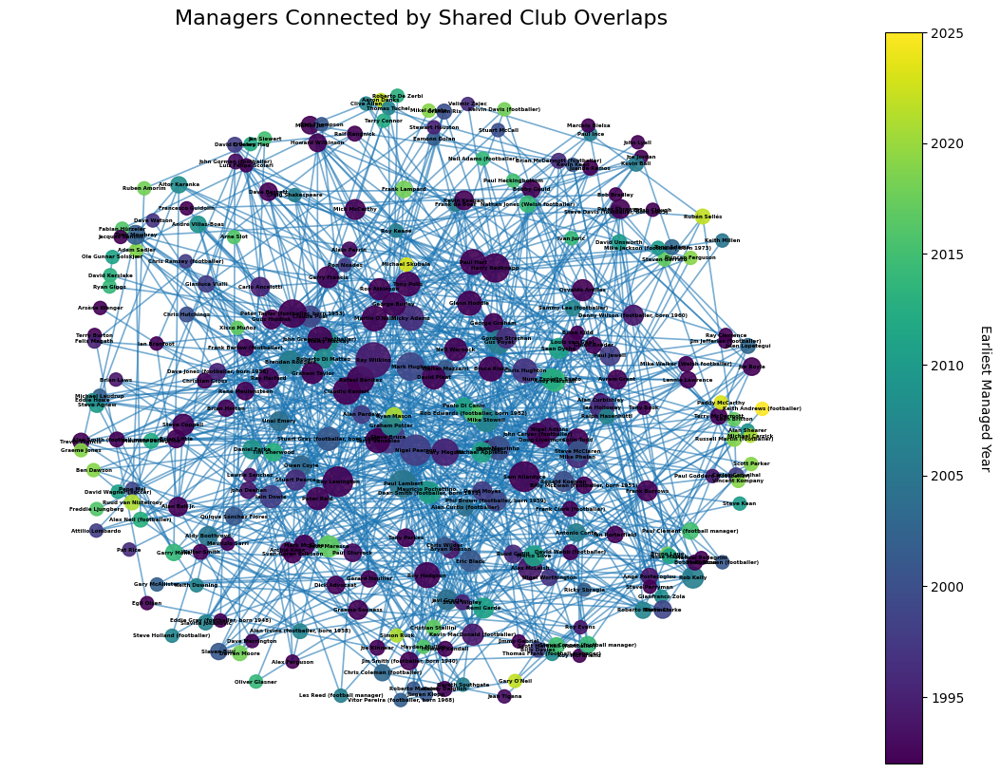

In [33]:
# --- Filter only "shared_club" edges between managers ---
H = nx.Graph(((u, v, d) for u, v, d in G.edges(data=True) if d.get("type") == "shared_club"))
for n in H.nodes():
    if n in G.nodes():
        H.nodes[n].update(G.nodes[n])

print(f"Initial shared-club graph: {H.number_of_nodes()} nodes, {H.number_of_edges()} edges")

# --- If no edges found, check what exists in G
if H.number_of_edges() == 0:
    print("⚠️ No shared-club edges found. Check your 'club_year_pairs' extraction.")
    print("Example node attributes:", list(G.nodes(data=True))[:3])

# --- Derive timeline info for coloring
# For managers: get their earliest managed year from edges
years = []
for n in H.nodes():
    if G.nodes[n].get("type") == "manager":
        managed_edges = [d for _, _, d in G.edges(n, data=True) if d.get("type") == "managed"]
        if managed_edges:
            start_years = [d.get("start") for d in managed_edges if d.get("start")]
            if start_years:
                H.nodes[n]["start_year"] = min(start_years)
                years.append(min(start_years))

# Fallback if no year data
if not years:
    years = [1992, 2025]  # Premier League era as fallback

min_year, max_year = min(years), max(years)
norm = plt.Normalize(min_year, max_year)
cmap = plt.cm.viridis

# --- Node colors and sizes ---
node_colors = [
    cmap(norm(H.nodes[n].get("start_year", 2000))) for n in H.nodes()
]
degrees = dict(H.degree())
node_sizes = [max(degrees[n] * 25, 100) for n in H.nodes()]  # ensure visible size

# --- Layout and draw ---
fig, ax = plt.subplots(figsize=(14, 10))
if H.number_of_edges() == 0:
    plt.text(0.5, 0.5, "No shared-club connections found", ha="center", va="center", fontsize=14)
else:
    pos = nx.spring_layout(H, seed=42, k=0.8)
    nx.draw_networkx_nodes(H, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9, ax=ax)
    nx.draw_networkx_edges(H, pos, edge_color="tab:blue", width=1.2, alpha=0.6, ax=ax)
    nx.draw_networkx_labels(H, pos, font_size=4, font_weight="bold", ax=ax)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("Earliest Managed Year", rotation=270, labelpad=20)

ax.set_title("Managers Connected by Shared Club Overlaps", fontsize=16)
ax.axis("off")
plt.savefig("manager_shared_club_overlap.png", dpi=300)
plt.show()



Linguistic similarity graph: 231 nodes, 1205 edges


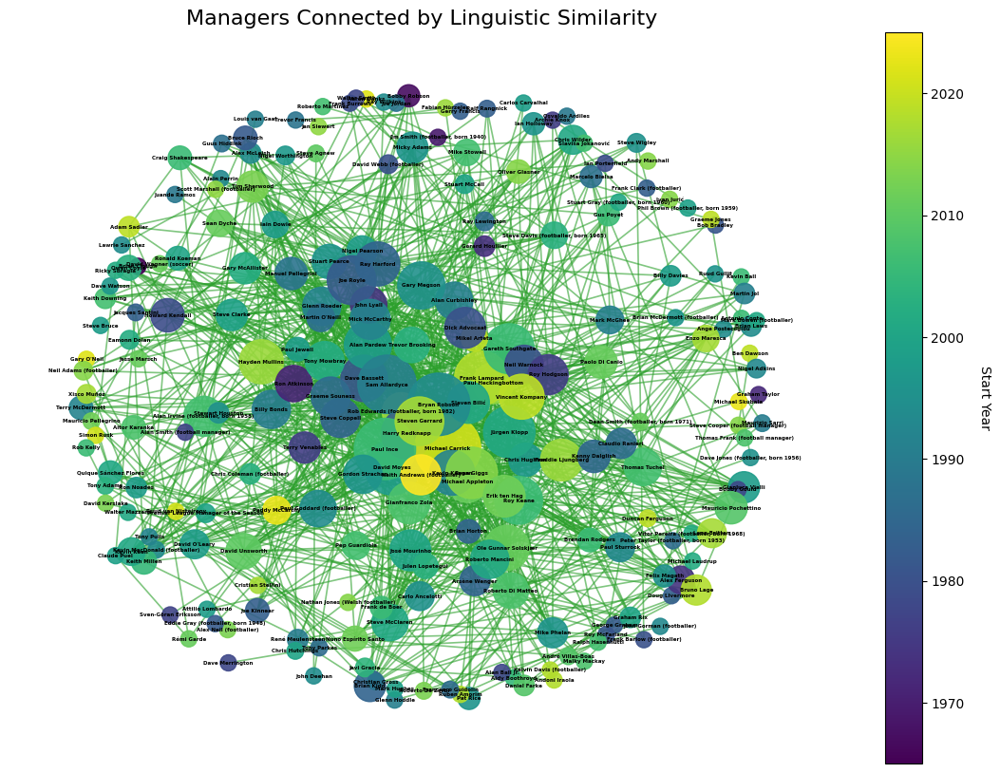

In [37]:
# --- Filter only "language" edges between managers ---
H = nx.Graph(((u, v, d) for u, v, d in G.edges(data=True) 
              if d.get("type") == "language"))

# Bring node attributes from G → H
for n in H.nodes():
    if n in G.nodes():
        H.nodes[n].update(G.nodes[n])

print(f"Linguistic similarity graph: {H.number_of_nodes()} nodes, {H.number_of_edges()} edges")

# --- If no edges found, warn ---
if H.number_of_edges() == 0:
    print("⚠️ No linguistic-similarity edges found.")
    print("Example node attributes:", list(G.nodes(data=True))[:3])


# --- Coloring based on start_year attribute already stored in G ---
years = [H.nodes[n].get("start_year")
         for n in H.nodes() if H.nodes[n].get("start_year")]

# fallback if empty
if not years:
    years = [1992, 2025]

min_year, max_year = min(years), max(years)
norm = plt.Normalize(min_year, max_year)
cmap = plt.cm.viridis

# --- FIX: replace None start_years ---
for n in H.nodes():
    if H.nodes[n].get("start_year") is None:
        H.nodes[n]["start_year"] = 2000

# --- Node colors + sizes ---
node_colors = [
    cmap(norm(H.nodes[n]["start_year"])) for n in H.nodes()
]
degrees = dict(H.degree())
node_sizes = [max(degrees[n] * 40, 150) for n in H.nodes()]


# --- Draw ---
fig, ax = plt.subplots(figsize=(14, 10))

if H.number_of_edges() == 0:
    plt.text(0.5, 0.5, "No linguistic similarity connections found",
             ha="center", va="center", fontsize=14)

else:
    pos = nx.spring_layout(H, seed=42, k=0.8)
    
    nx.draw_networkx_nodes(
        H, pos, node_color=node_colors, node_size=node_sizes,
        alpha=0.9, ax=ax
    )
    nx.draw_networkx_edges(
        H, pos, edge_color="tab:green", width=1.2, alpha=0.6, ax=ax
    )
    nx.draw_networkx_labels(
        H, pos, font_size=4, font_weight="bold", ax=ax
    )

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("Start Year", rotation=270, labelpad=20)

ax.set_title("Managers Connected by Linguistic Similarity", fontsize=16)
ax.axis("off")
plt.show()


Eras with data: ['2015-2025', '2005-2015', '1995-2005']
Aaron Danks → earliest year: 2022 text length: 1255
Adam Sadler → earliest year: 2023 text length: 802
Aidy Boothroyd → earliest year: 2005 text length: 2964


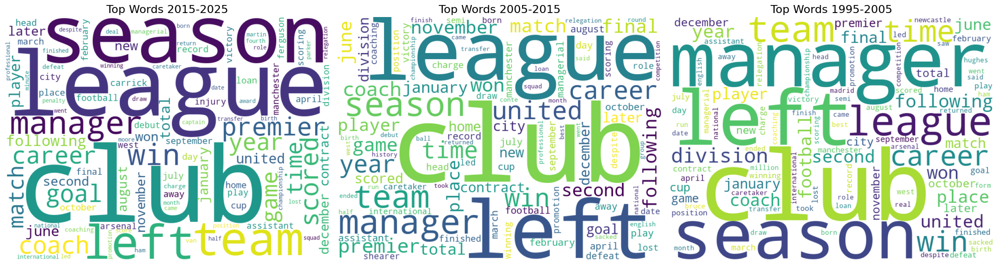

In [7]:
# --- Define eras ---
eras = [
    (1995, 2005),
    (2005, 2015),
    (2015, 2025)
]

# --- Collect texts by era ---
era_texts = defaultdict(str)

for n, attrs in G.nodes(data=True):
    if attrs.get("type") != "manager":
        continue  # skip clubs

    text = attrs.get("text", "")
    if not text:
        continue

    # Find earliest managed year from "managed" edges
    managed_edges = [d for _, _, d in G.edges(n, data=True) if d.get("type") == "managed"]
    if not managed_edges:
        continue

    start_years = [d.get("start") for d in managed_edges if d.get("start")]
    if not start_years:
        continue

    year = min(start_years)
    for (start, end) in eras:
        if start <= year < end:
            era_texts[f"{start}-{end}"] += " " + text
            break

print(f"Eras with data: {list(era_texts.keys())}")

# --- Quick debug output ---
for n, data in list(G.nodes(data=True))[:5]:
    if data.get("type") == "manager":
        managed_edges = [d for _, _, d in G.edges(n, data=True) if d.get("type") == "managed"]
        starts = [d.get("start") for d in managed_edges if d.get("start")]
        print(n, "→", "earliest year:", min(starts) if starts else None, 
              "text length:", len(data.get("text", "")))


fig, axes = plt.subplots(1, len(era_texts), figsize=(20, 8))
if len(era_texts) == 1:
    axes = [axes]

for ax, (era, text) in zip(axes, era_texts.items()):
    wc = WordCloud(
        width=800,
        height=600,
        background_color="white",
        colormap="viridis",
        max_words=100,
        collocations=False
    ).generate(text)
    
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title(f"Top Words {era}", fontsize=16)
    ax.axis("off")

plt.tight_layout()
plt.show()


# FOOTBALL TERMINOLOGY

In [57]:
terminology_dir = "football_terminology"
pages_dir = "football_pages"

# Load all .txt files and combine them into one reference corpus
terminology_text = ""
for fname in os.listdir(terminology_dir):
    if not fname.endswith(".txt"):
        continue
    with open(os.path.join(terminology_dir, fname), encoding="utf-8") as f:
        terminology_text += " " + f.read().lower()
        
for fname in os.listdir(pages_dir):
    if not fname.endswith(".txt"):
        continue
    with open(os.path.join(pages_dir, fname), encoding="utf-8") as f:
        terminology_text += " " + f.read().lower()

print(f"✅ Combined terminology corpus length: {len(terminology_text)} characters")

✅ Combined terminology corpus length: 7386078 characters


In [51]:
managers_dir = "managers"
manager_texts = {}

for fname in os.listdir(managers_dir):
    if not fname.endswith(".txt"):
        continue
    name = fname[:-4].replace("_", " ")
    with open(os.path.join(managers_dir, fname), encoding="utf-8") as f:
        raw = f.read().lower()
    tokens = analyzer(raw)
    manager_texts[name] = " ".join(tokens)

print(f"✅ Loaded {len(manager_texts)} manager documents.")

✅ Loaded 290 manager documents.


In [64]:
docs = [terminology_text] + list(manager_texts.values())
names = ["⚽ Football Terminology"] + list(manager_texts.keys())


# --- 4. Build TF-IDF model ---
vec = TfidfVectorizer(
    analyzer=analyzer,
    min_df=0.001,     # keep rare tactical terms
    max_df=0.85,       # remove too common words
    sublinear_tf=True,
    norm="l2"
)

X = vec.fit_transform(docs)
print(f"✅ TF-IDF matrix shape: {X.shape} (docs × terms)")


✅ TF-IDF matrix shape: (291, 11008) (docs × terms)


In [65]:
similarity = cosine_similarity(X)
term_index = 0  # first document is the terminology reference

scores = {
    names[i]: similarity[term_index, i]
    for i in range(1, len(names))
}

sorted_scores = sorted(scores.items(), key=lambda x: x[1], reverse=True)

print("\n🏆 Managers most similar to football terminology language:")
for name, score in sorted_scores[:15]:
    print(f"{name:35s} | {score:.3f}")



🏆 Managers most similar to football terminology language:
José Mourinho                       | 0.361
Arsène Wenger                       | 0.336
Alex Ferguson                       | 0.316
Kevin Keegan                        | 0.315
Thomas Tuchel                       | 0.301
Roy Keane                           | 0.298
Ryan Giggs                          | 0.282
Carlo Ancelotti                     | 0.282
Frank Lampard                       | 0.271
Pep Guardiola                       | 0.271
Brian Clough                        | 0.269
Jürgen Klopp                        | 0.268
Steven Gerrard                      | 0.266
Roy Hodgson                         | 0.261
Roberto Mancini                     | 0.261


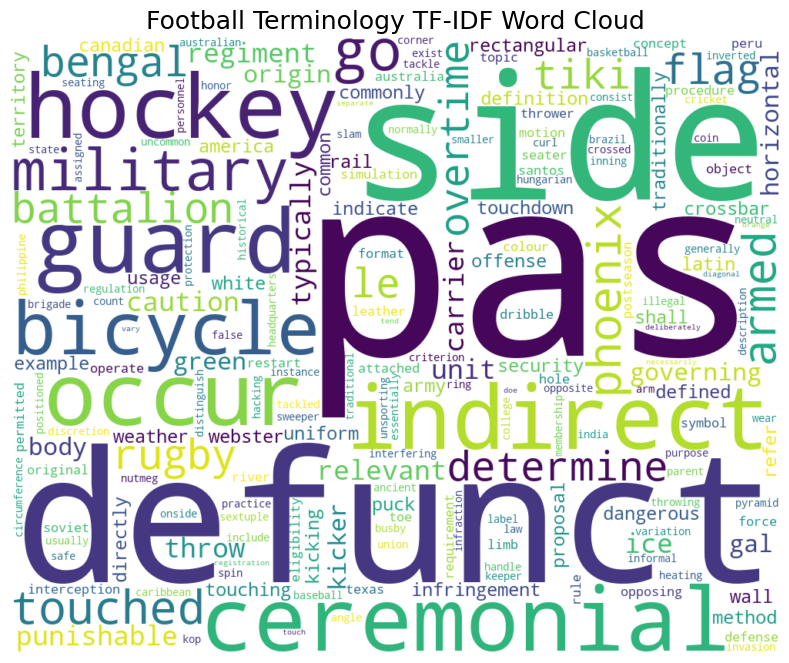

In [66]:
# --- Get feature names and TF-IDF scores for the football terminology document ---
feature_names = np.array(vec.get_feature_names_out())
term_vec = X[0].toarray().ravel()  # first document = football terminology

# --- Create mapping of {word: tfidf_score} ---
tfidf_dict = {
    feature_names[i]: term_vec[i]
    for i in range(len(feature_names))
    if term_vec[i] > 0
}

# --- Generate WordCloud ---
wc = WordCloud(
    width=1000,
    height=800,
    background_color="white",
    colormap="viridis",
    max_words=200
).generate_from_frequencies(tfidf_dict)

# --- Plot ---
plt.figure(figsize=(12, 8))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Football Terminology TF-IDF Word Cloud", fontsize=18)
plt.show()


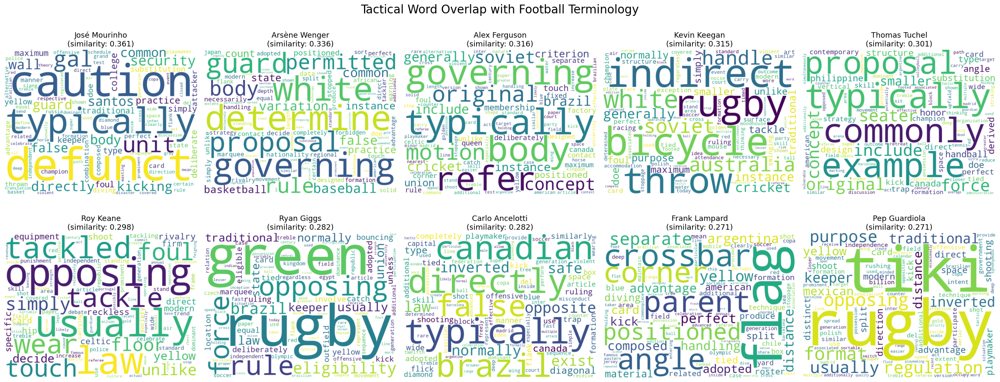

In [67]:
# --- Get feature names and terminology vector ---
feature_names = np.array(vec.get_feature_names_out())
term_vec = X[term_index].toarray().ravel()

# --- Create word clouds for top 10 managers ---
top_n = 10
fig, axes = plt.subplots(2, 5, figsize=(24, 10))
axes = axes.flatten()

for ax, (name, score) in zip(axes, sorted_scores[:top_n]):
    idx = names.index(name)
    mgr_vec = X[idx].toarray().ravel()

    # element-wise minimum of term weights to highlight overlap
    shared = np.minimum(term_vec, mgr_vec)

    # Build a frequency dict for the word cloud
    tfidf_dict = {
        feature_names[i]: shared[i]
        for i in range(len(shared))
        if shared[i] > 0
    }

    # Skip empty results safely
    if not tfidf_dict:
        ax.text(0.5, 0.5, "No shared terms", ha="center", va="center")
        ax.axis("off")
        ax.set_title(name, fontsize=14)
        continue

    wc = WordCloud(
        width=800,
        height=600,
        background_color="white",
        colormap="viridis",
        max_words=100
    ).generate_from_frequencies(tfidf_dict)

    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"{name}\n(similarity: {score:.3f})", fontsize=13)

plt.suptitle("Tactical Word Overlap with Football Terminology", fontsize=20)
plt.tight_layout()
plt.show()

# FOOTBALL PAGES

In [16]:
terminology_dir = "football_pages"

# Load all .txt files and combine them into one reference corpus
terminology_text = ""
for fname in os.listdir(terminology_dir):
    if not fname.endswith(".txt"):
        continue
    with open(os.path.join(terminology_dir, fname), encoding="utf-8") as f:
        terminology_text += " " + f.read().lower()

print(f"✅ Combined terminology corpus length: {len(terminology_text)} characters")

✅ Combined terminology corpus length: 558856 characters


In [17]:
docs = [terminology_text] + list(manager_texts.values())
names = ["⚽ Football Terminology"] + list(manager_texts.keys())


# --- 4. Build TF-IDF model ---
vec = TfidfVectorizer(
    analyzer=analyzer,
    min_df=0.001,     # keep rare tactical terms
    max_df=0.80,       # remove too common words
    sublinear_tf=True,
    norm="l2"
)

X = vec.fit_transform(docs)
print(f"✅ TF-IDF matrix shape: {X.shape} (docs × terms)")

✅ TF-IDF matrix shape: (291, 8359) (docs × terms)


In [18]:
similarity = cosine_similarity(X)
term_index = 0  # first document is the terminology reference

scores = {
    names[i]: similarity[term_index, i]
    for i in range(1, len(names))
}

sorted_scores = sorted(scores.items(), key=lambda x: x[1], reverse=True)

print("\n🏆 Managers most similar to football terminology language:")
for name, score in sorted_scores[:15]:
    print(f"{name:35s} | {score:.3f}")


🏆 Managers most similar to football terminology language:
José Mourinho                       | 0.357
Arsène Wenger                       | 0.318
Thomas Tuchel                       | 0.313
Pep Guardiola                       | 0.312
Carlo Ancelotti                     | 0.311
Kevin Keegan                        | 0.296
Antonio Conte                       | 0.292
Alex Ferguson                       | 0.288
Ryan Giggs                          | 0.284
Jürgen Klopp                        | 0.279
Roy Keane                           | 0.275
Frank Lampard                       | 0.275
Michael Laudrup                     | 0.274
Steven Gerrard                      | 0.273
Roberto Mancini                     | 0.272


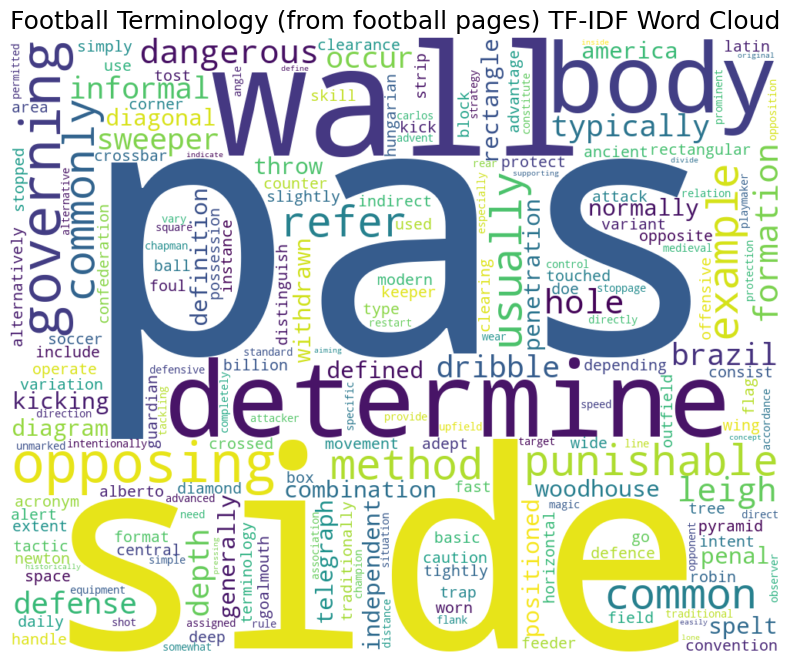

In [19]:
# --- Get feature names and TF-IDF scores for the football terminology document ---
feature_names = np.array(vec.get_feature_names_out())
term_vec = X[0].toarray().ravel()  # first document = football terminology

# --- Create mapping of {word: tfidf_score} ---
tfidf_dict = {
    feature_names[i]: term_vec[i]
    for i in range(len(feature_names))
    if term_vec[i] > 0
}

# --- Generate WordCloud ---
wc = WordCloud(
    width=1000,
    height=800,
    background_color="white",
    colormap="viridis",
    max_words=200
).generate_from_frequencies(tfidf_dict)

# --- Plot ---
plt.figure(figsize=(12, 8))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("Football Terminology (from football pages) TF-IDF Word Cloud", fontsize=18)
plt.show()

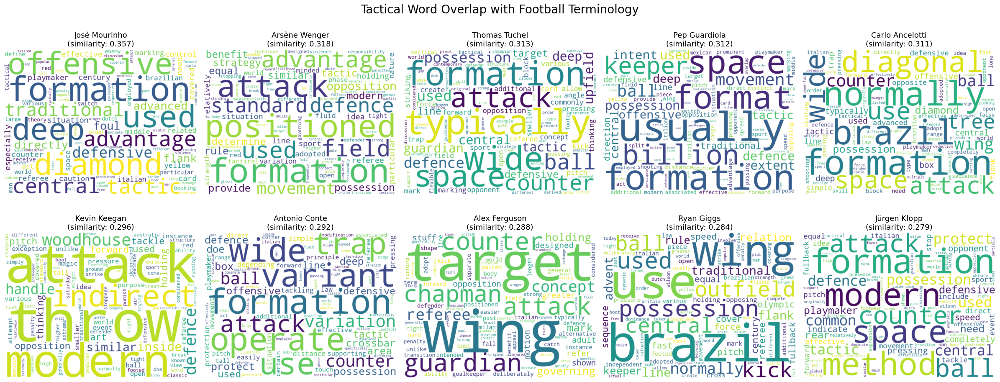

In [20]:
# --- Get feature names and terminology vector ---
feature_names = np.array(vec.get_feature_names_out())
term_vec = X[term_index].toarray().ravel()

# --- Create word clouds for top 10 managers ---
top_n = 10
fig, axes = plt.subplots(2, 5, figsize=(24, 10))
axes = axes.flatten()

for ax, (name, score) in zip(axes, sorted_scores[:top_n]):
    idx = names.index(name)
    mgr_vec = X[idx].toarray().ravel()

    # element-wise minimum of term weights to highlight overlap
    shared = np.minimum(term_vec, mgr_vec)

    # Build a frequency dict for the word cloud
    tfidf_dict = {
        feature_names[i]: shared[i]
        for i in range(len(shared))
        if shared[i] > 0
    }

    # Skip empty results safely
    if not tfidf_dict:
        ax.text(0.5, 0.5, "No shared terms", ha="center", va="center")
        ax.axis("off")
        ax.set_title(name, fontsize=14)
        continue

    wc = WordCloud(
        width=800,
        height=600,
        background_color="white",
        colormap="viridis",
        max_words=100
    ).generate_from_frequencies(tfidf_dict)

    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"{name}\n(similarity: {score:.3f})", fontsize=13)

plt.suptitle("Tactical Word Overlap with Football Terminology", fontsize=20)
plt.tight_layout()
plt.show()

In [68]:
def folder_size(path):
    total = 0
    for root, dirs, files in os.walk(path):
        for f in files:
            fp = os.path.join(root, f)
            if os.path.isfile(fp):
                total += os.path.getsize(fp)
    return total

def count_files(path):
    return sum(1 for f in os.listdir(path) if os.path.isfile(os.path.join(path, f)))

def format_bytes(size):
    for unit in ['B','KB','MB','GB','TB']:
        if size < 1024:
            return f"{size:.2f} {unit}"
        size /= 1024

# ---- MANAGERS ----
folder_path = "managers"
size_bytes = folder_size(folder_path)
num_files = count_files(folder_path)

print(f"Managers folder: {num_files} files, {format_bytes(size_bytes)}")

# ---- FOOTBALL PAGES ----
folder_path = "football_pages"
size_bytes = folder_size(folder_path)
num_files = count_files(folder_path)

print(f"Football pages folder: {num_files} files, {format_bytes(size_bytes)}")

# ---- TERMINOLOGY ----
folder_path = "football_terminology"
size_bytes = folder_size(folder_path)
num_files = count_files(folder_path)

print(f"Terminology folder: {num_files} files, {format_bytes(size_bytes)}")



Managers folder: 290 files, 14.57 MB
Football pages folder: 5 files, 549.98 KB
Terminology folder: 252 files, 6.60 MB
